In [3]:
import os
from glob import glob
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
# from skimage.metrics import peak_signal_noise_ratio as psnr
# from skimage.metrics import structural_similarity as ssim
# from skimage.metrics import normalized_root_mse as nrmse


# from cardiac.bulleye_gen import gen_bulleye
from cardiac.segment.functions import naive_segment_lv_mask, naive_cal_circle_param
# from cardiac.segment.advanced_segment import cal_lv_mask, naive_locate

from cardiac.segment.functions import naive_locate, naive_cal_myocardium_line_param, recursive_search_myocardium_line_param, generate_mask3d_from_param

from cardiac.segment.visualize import visualize



In [4]:
def read_sitk_img(path, zoom_factor = 3):
    sitk_img = sitk.ReadImage(path)
    img_arr = sitk.GetArrayFromImage(sitk_img)
    width = 20
    # 计算中心位置
    center = np.array(img_arr.shape)//2
    start = center - width//2
    end = center + width//2
    
    clipped_img_arr = img_arr[:, start[1]:end[1], start[2]:end[2]].copy()
    
    # zoom_factor = 3
    zoomed_clipped_img_arr = zoom(clipped_img_arr, zoom_factor, cval=0)
    voxel_size = np.array(sitk_img.GetSpacing()[::-1])/zoom_factor
    return zoomed_clipped_img_arr, voxel_size


Patient_0000
(57, 60, 60) [2.21456671 2.21456639 2.21456639]
限制条件:  min_volume(mm^3):40000, min_distance(mm):100
当前连通域:  volume:68149.62255761097, distance:7.606751305475518
naive_segment_lv_mask Success
{
    "center": {
        "cy": 32.845986674827955,
        "cx": 29.055268851974095
    },
    "radius": 11.41560869422423,
    "apex_z": 9,
    "base_z": 45,
    "dividing_z": 29.123413041336345
}


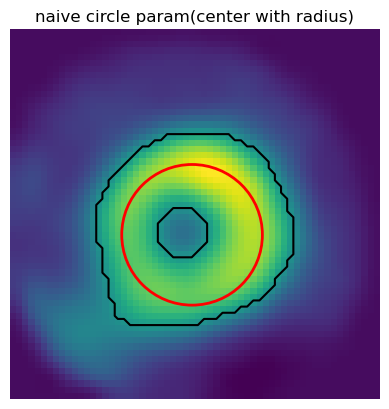

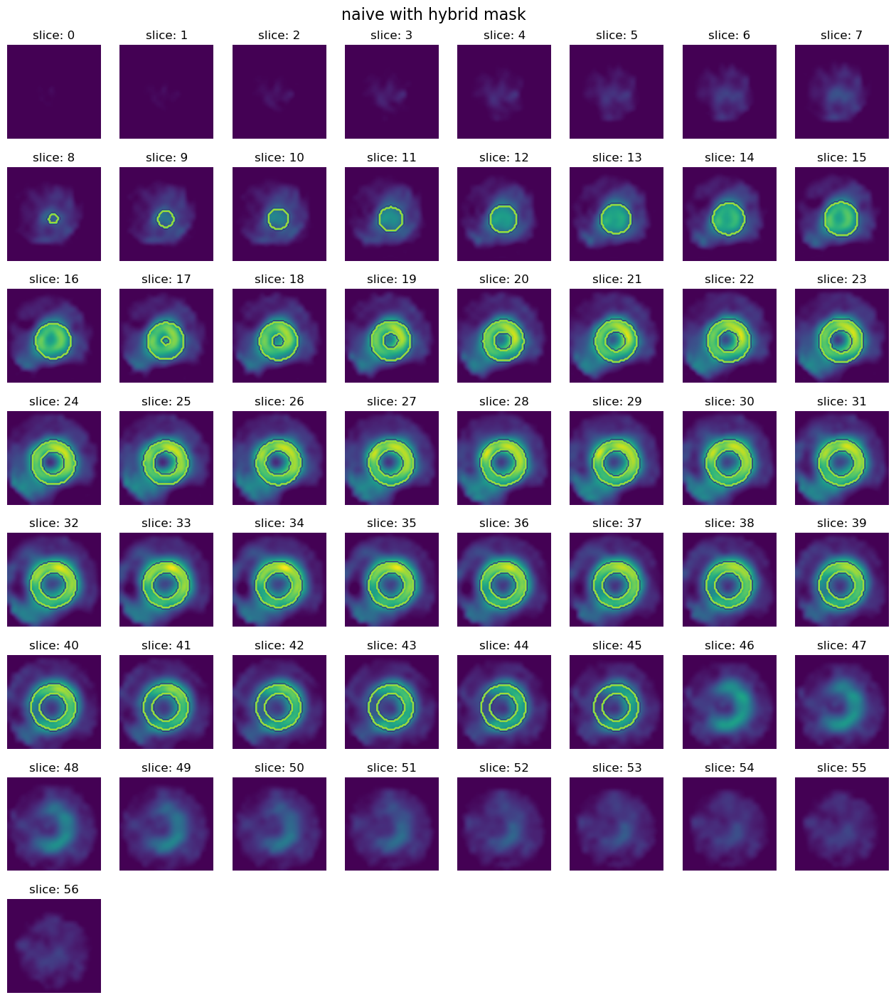

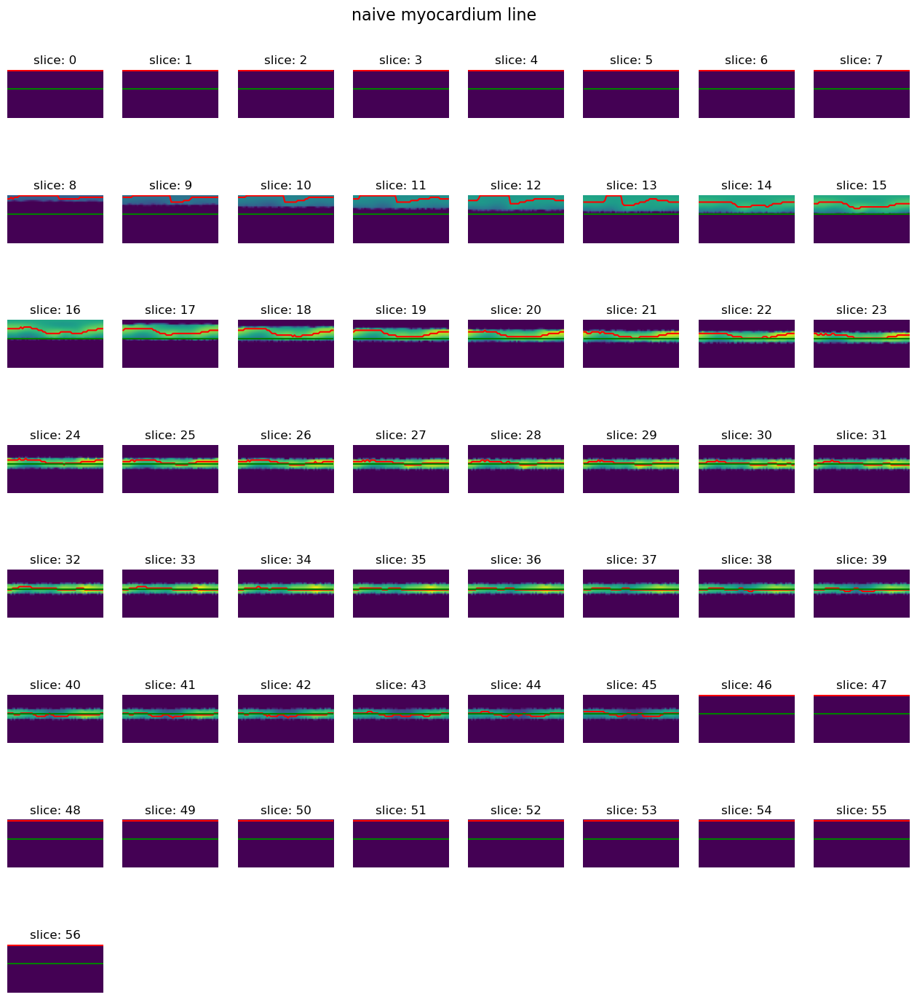

*******************************New param*******************************
True True True True
{
    "center": {
        "cy": 32.460635922943986,
        "cx": 28.969434570739853
    },
    "radius": 11.0,
    "apex_z": 9,
    "base_z": 43,
    "z_map": null,
    "dividing_z": 27.5
}


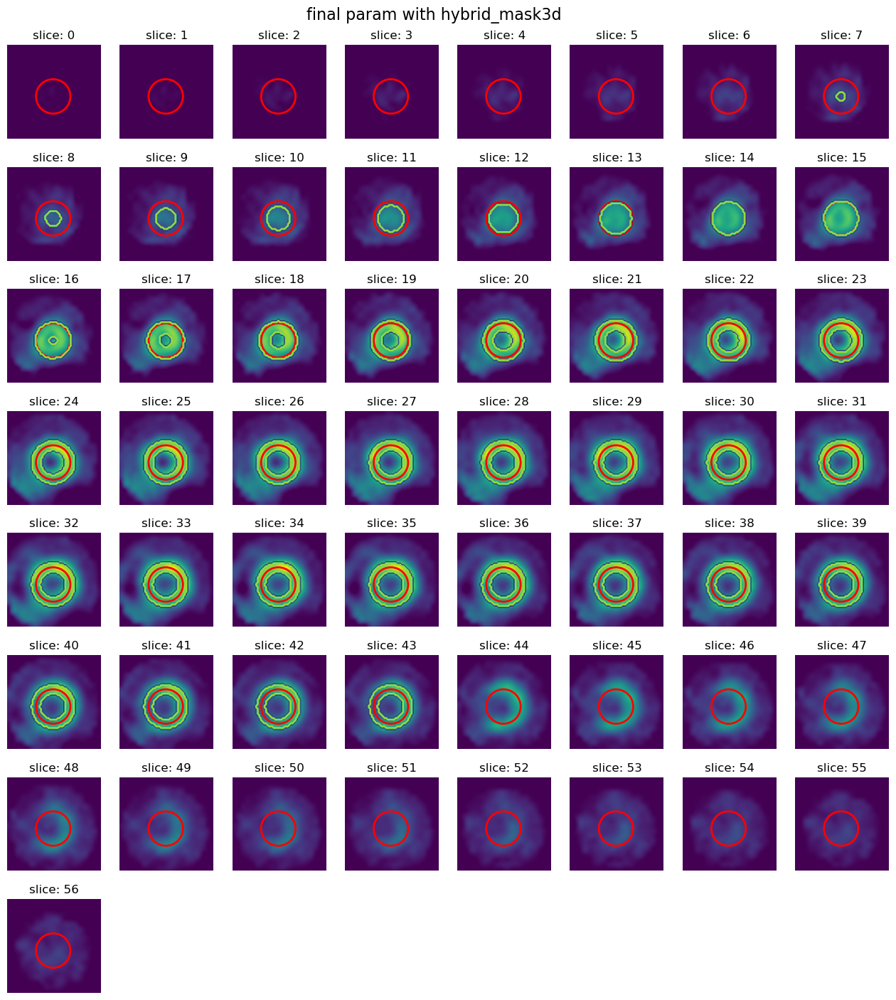

*******************************final_param_with_plane*******************************
{
    "center": {
        "cy": 32.460635922943986,
        "cx": 28.969434570739853
    },
    "radius": 11.0,
    "apex_z": 9,
    "base_z": 43,
    "z_map": null,
    "dividing_z": 27.5,
    "plane": {
        "a": 0,
        "b": 0,
        "c": 0,
        "d": 1
    },
    "angled_plane": {
        "44": [
            0,
            1,
            2,
            3,
            4,
            5,
            6,
            7,
            8,
            9,
            10,
            11,
            12,
            13,
            14,
            15,
            16,
            17,
            18,
            19,
            20,
            21,
            22,
            23,
            24,
            25,
            26,
            27,
            28,
            29,
            30,
            31,
            32,
            33,
            34,
            35,
            36,
            37,
    

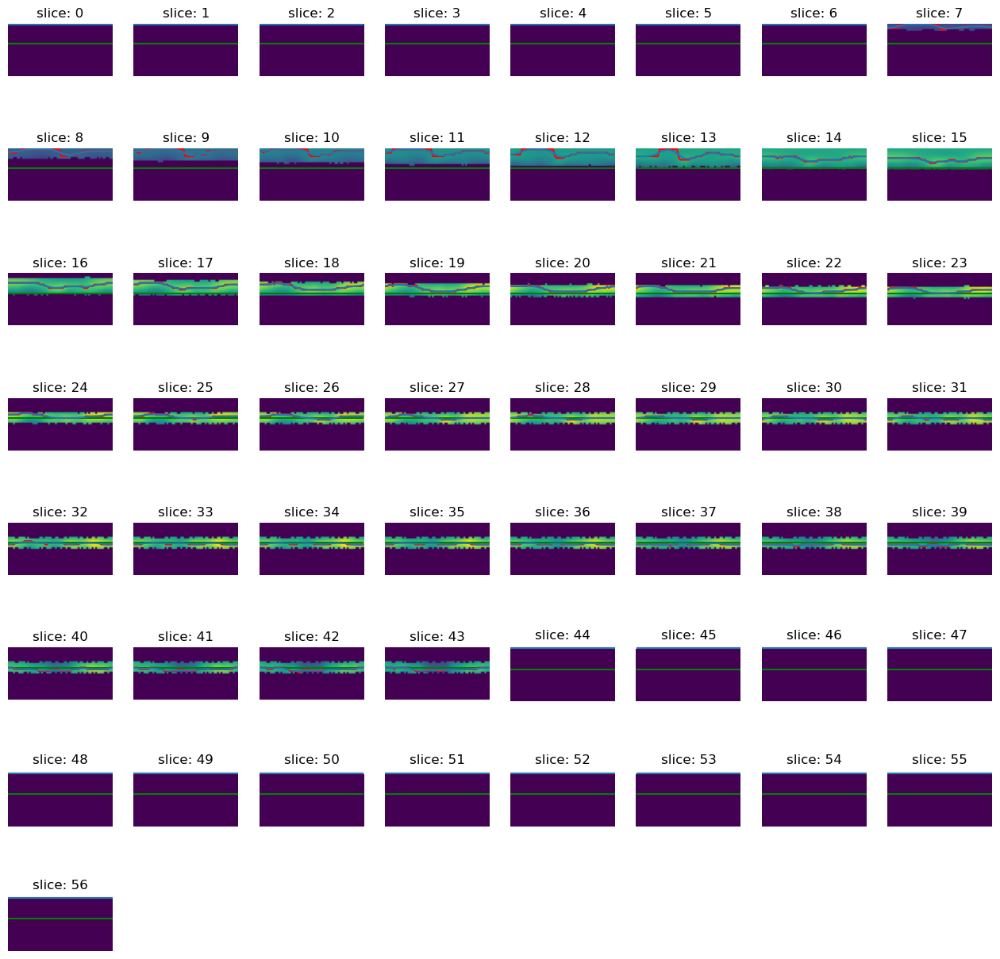

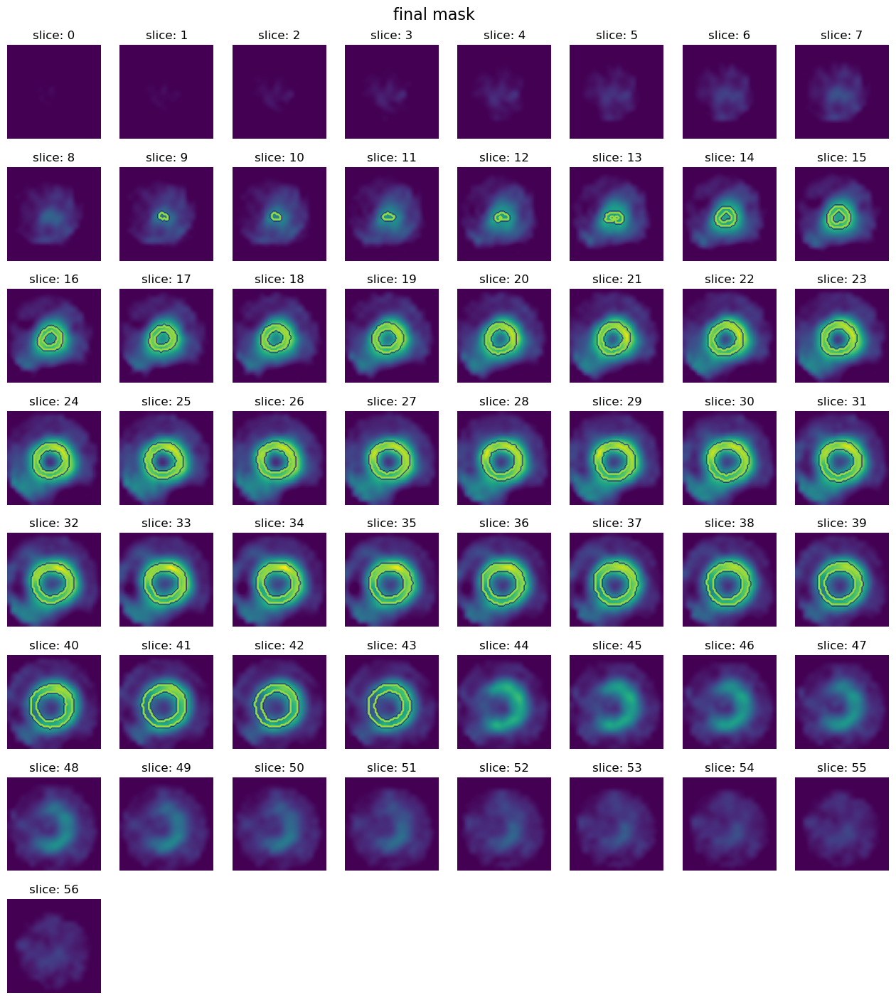

Patient_0001
(57, 60, 60) [2.21456671 2.21456639 2.21456639]
限制条件:  min_volume(mm^3):40000, min_distance(mm):100
当前连通域:  volume:44065.00050328333, distance:27.404556076104985
naive_segment_lv_mask Success
{
    "center": {
        "cy": 32.824721925344356,
        "cx": 30.796218737611753
    },
    "radius": 14.72322545872024,
    "apex_z": 3,
    "base_z": 43,
    "dividing_z": 28.08483818808036
}


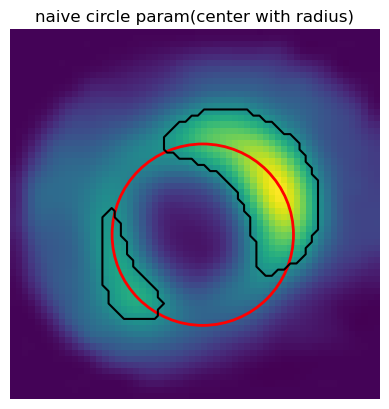

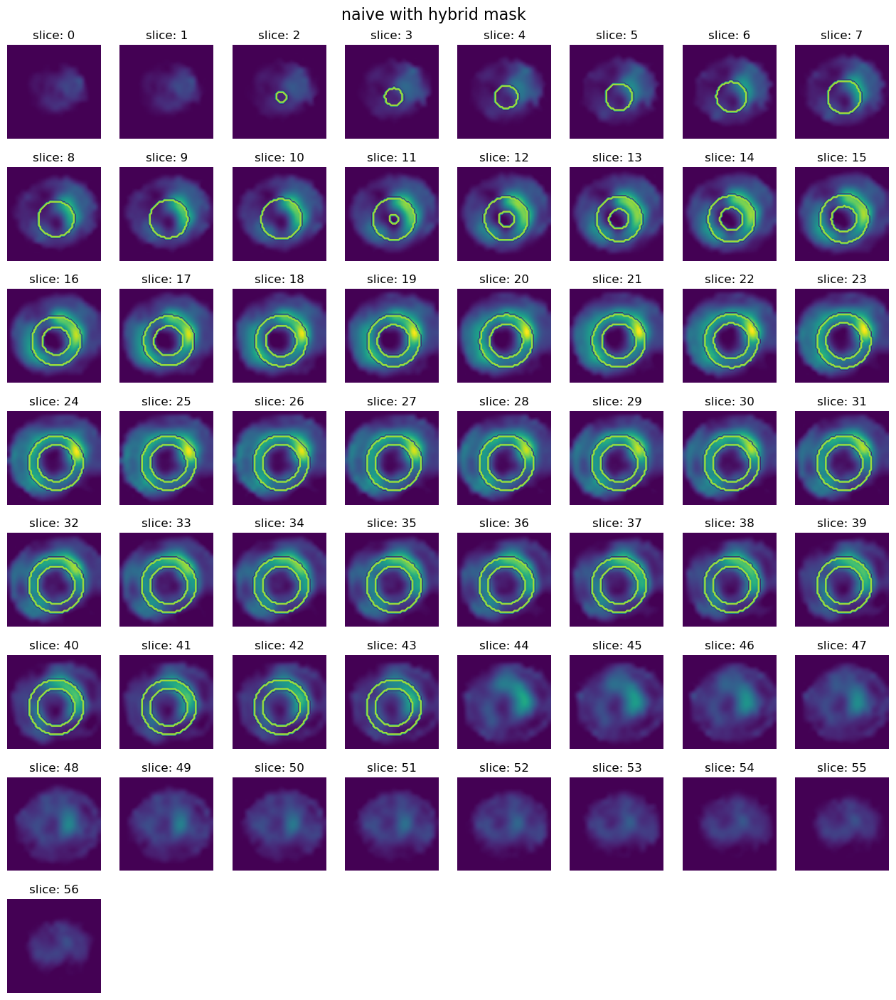

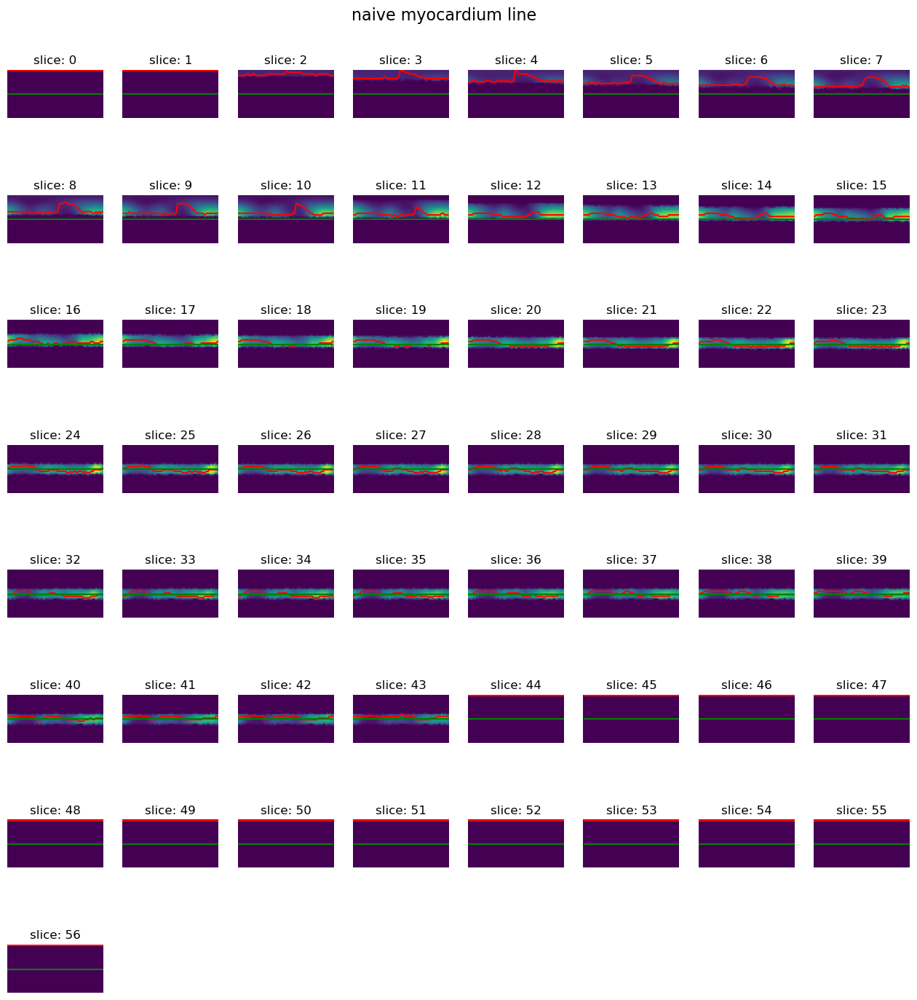

*******************************New param*******************************
True True False True
{
    "center": {
        "cy": 32.15309748237843,
        "cx": 30.67669323280736
    },
    "radius": 15.0,
    "apex_z": 0,
    "base_z": 43,
    "z_map": null,
    "dividing_z": 24.5
}


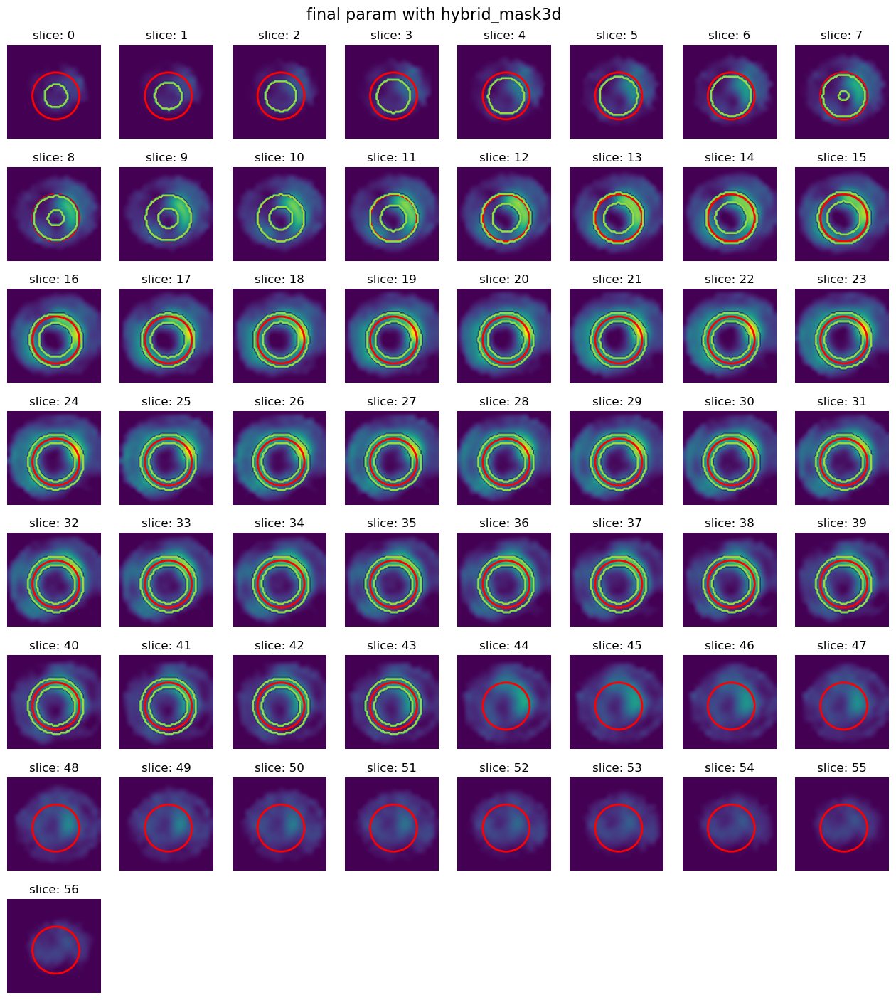

*******************************final_param_with_plane*******************************
{
    "center": {
        "cy": 32.15309748237843,
        "cx": 30.67669323280736
    },
    "radius": 15.0,
    "apex_z": 0,
    "base_z": 43,
    "z_map": null,
    "dividing_z": 24.5,
    "plane": {
        "a": 0,
        "b": 0,
        "c": 0,
        "d": 1
    },
    "angled_plane": {
        "25": [
            14
        ],
        "26": [
            14
        ],
        "27": [
            14
        ],
        "28": [
            14
        ],
        "29": [
            14
        ],
        "30": [
            14
        ],
        "31": [
            14
        ],
        "32": [
            14
        ],
        "33": [
            14
        ],
        "34": [
            14
        ],
        "35": [
            14
        ],
        "36": [
            14
        ],
        "37": [
            14
        ],
        "38": [
            14
        ],
        "39": [
            14
 

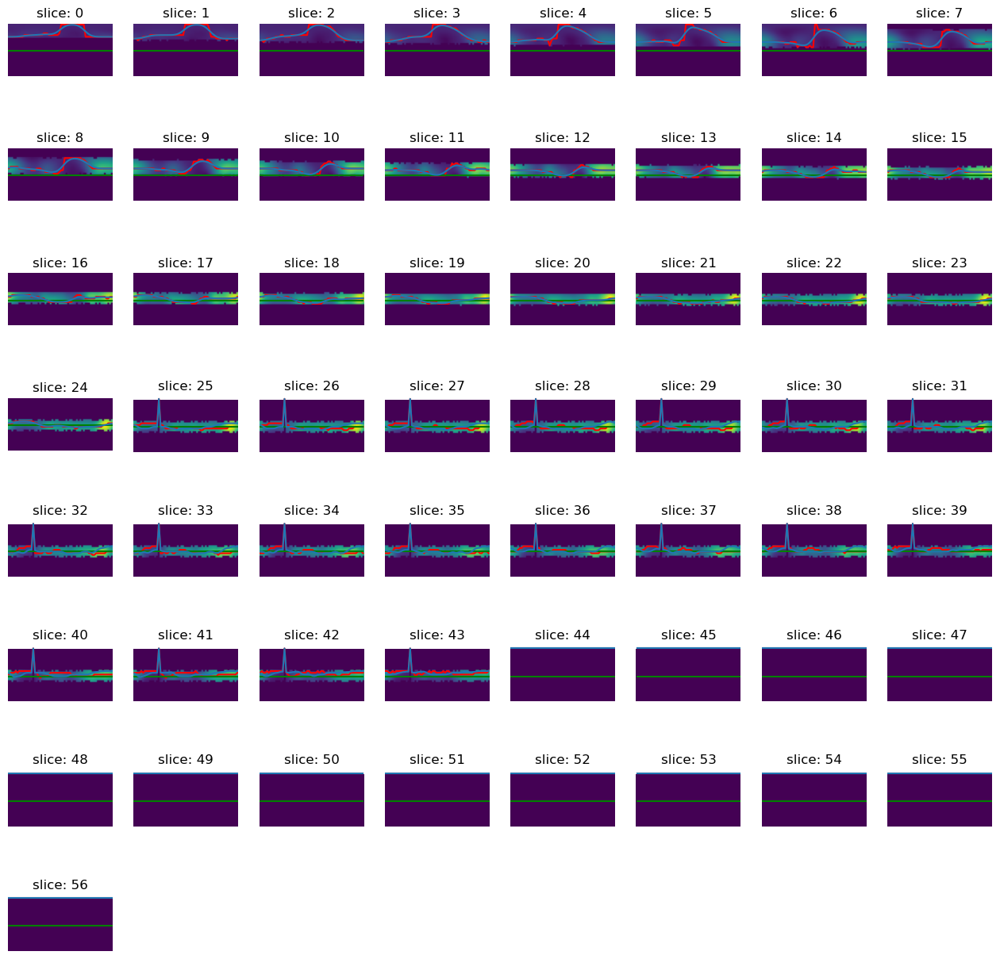

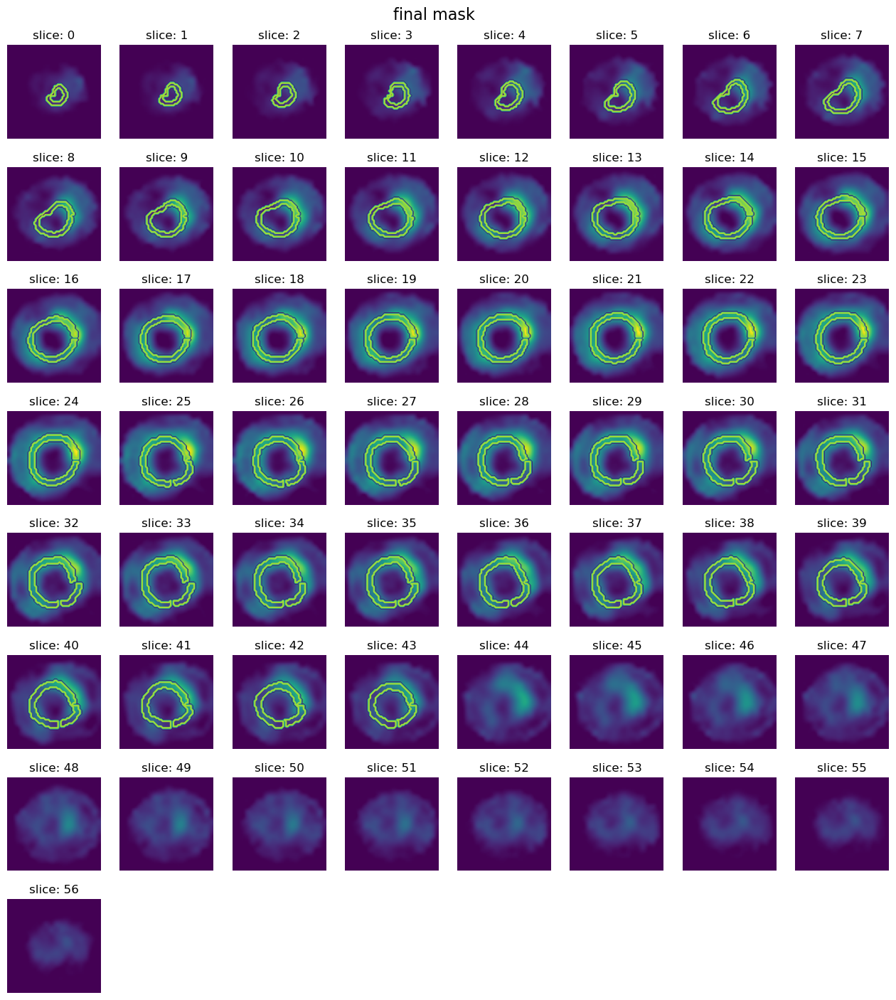

Patient_0002
(51, 60, 60) [2.21456671 2.21456639 2.21456639]
限制条件:  min_volume(mm^3):40000, min_distance(mm):100
当前连通域:  volume:69442.26750621878, distance:23.98620561022382
naive_segment_lv_mask Success
{
    "center": {
        "cy": 26.35024172539794,
        "cx": 28.38894740126153
    },
    "radius": 10.592136906506651,
    "apex_z": 0,
    "base_z": 41,
    "dividing_z": 18.888205359759976
}


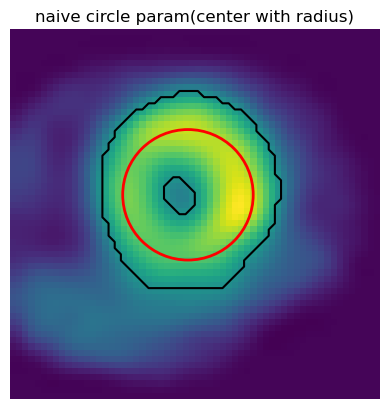

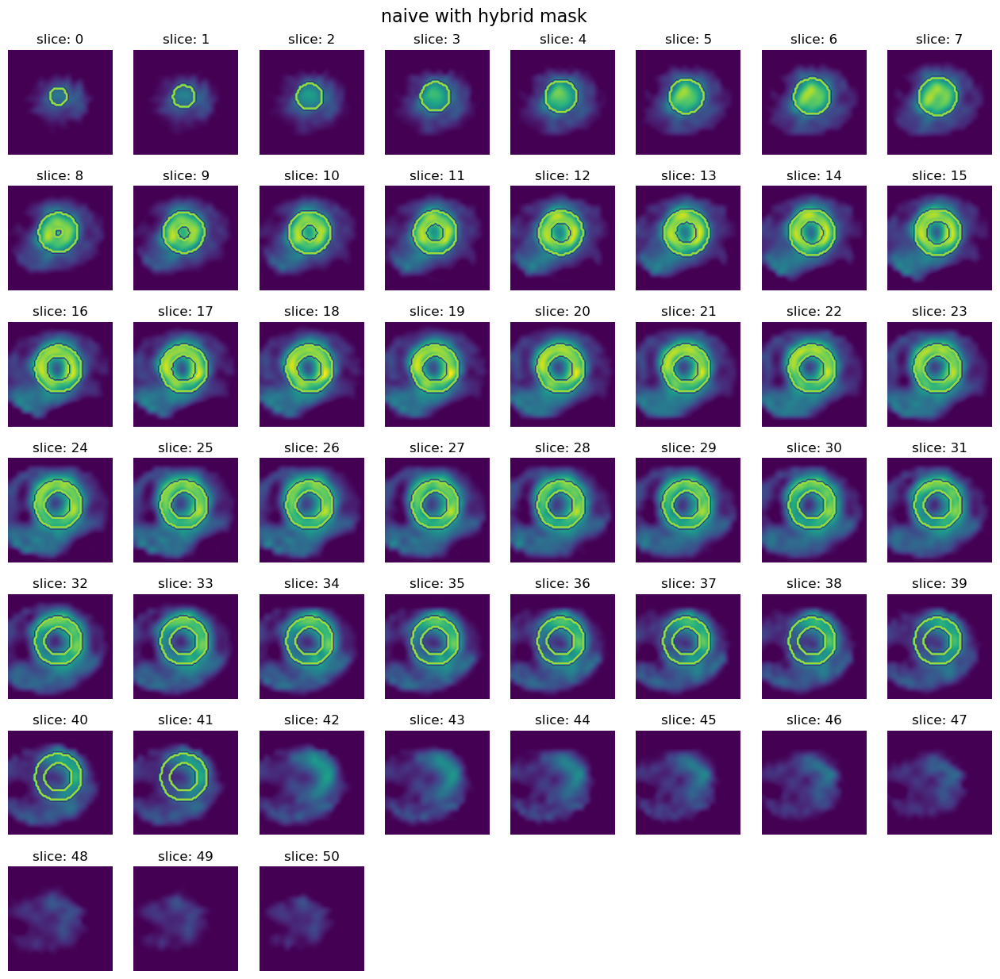

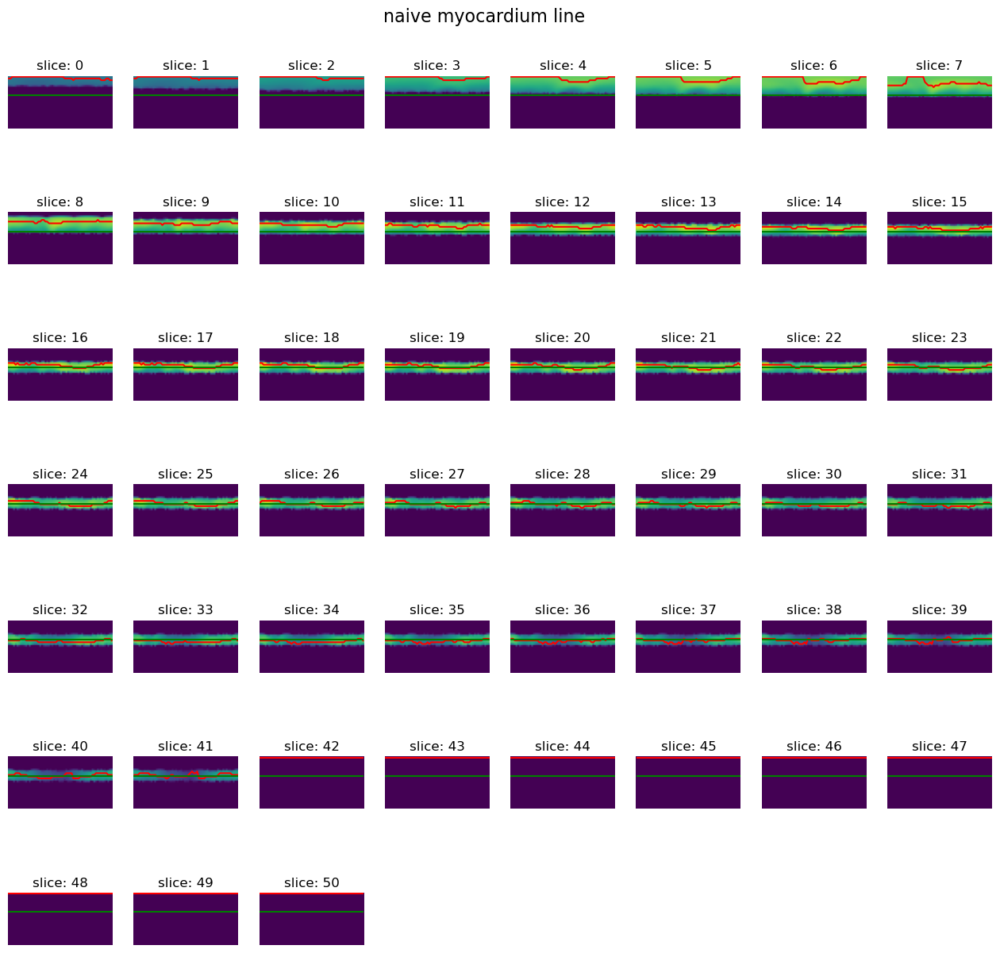

*******************************New param*******************************
True True False True
{
    "center": {
        "cy": 25.861343172332266,
        "cx": 27.953480013528857
    },
    "radius": 10.0,
    "apex_z": 4,
    "base_z": 39,
    "z_map": null,
    "dividing_z": 21.0
}


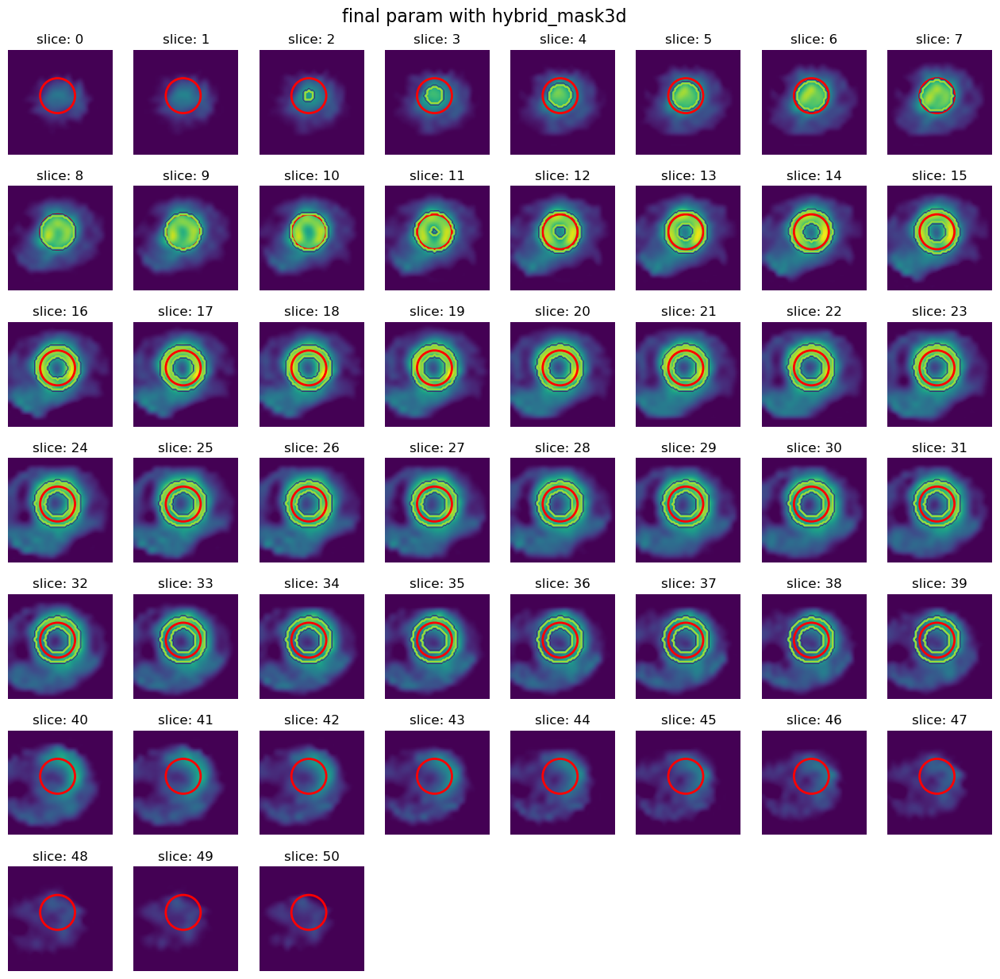

*******************************final_param_with_plane*******************************
{
    "center": {
        "cy": 25.861343172332266,
        "cx": 27.953480013528857
    },
    "radius": 10.0,
    "apex_z": 4,
    "base_z": 39,
    "z_map": null,
    "dividing_z": 21.0,
    "plane": {
        "a": 0,
        "b": 0,
        "c": 0,
        "d": 1
    },
    "angled_plane": {
        "40": [
            0,
            1,
            2,
            3,
            4,
            5,
            6,
            7,
            8,
            9,
            10,
            11,
            12,
            13,
            14,
            15,
            16,
            17,
            18,
            19,
            20,
            21,
            22,
            23,
            24,
            25,
            26,
            27,
            28,
            29,
            30,
            31,
            32,
            33,
            34,
            35,
            36,
            37,
    

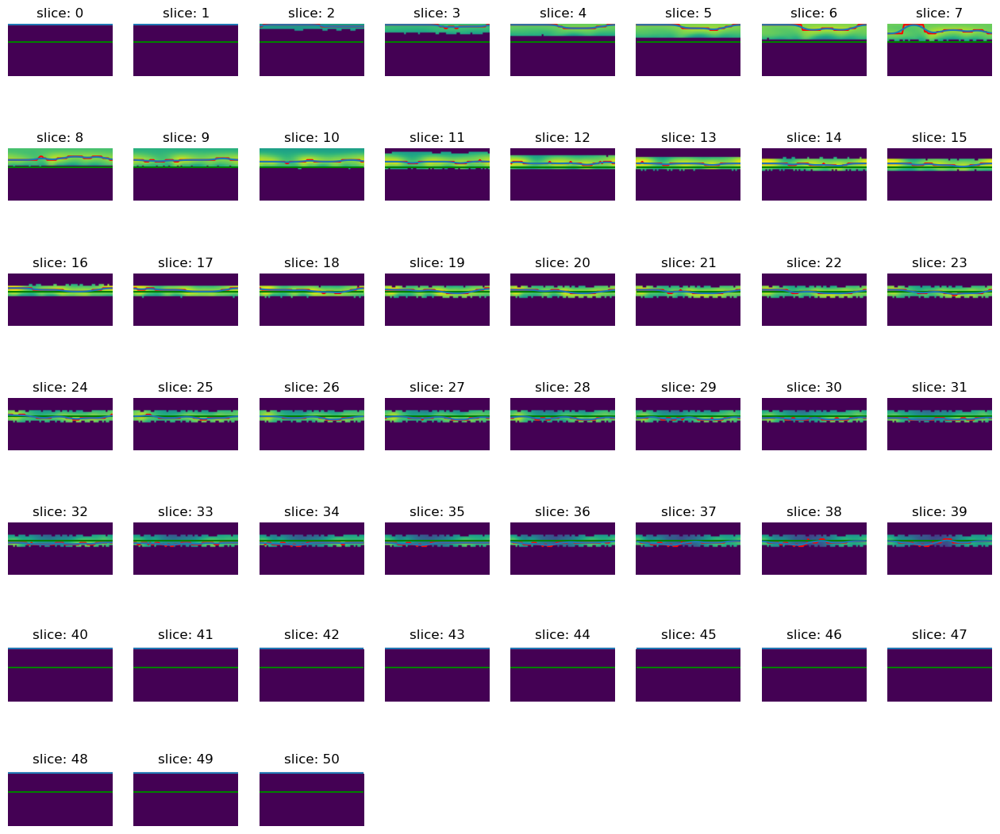

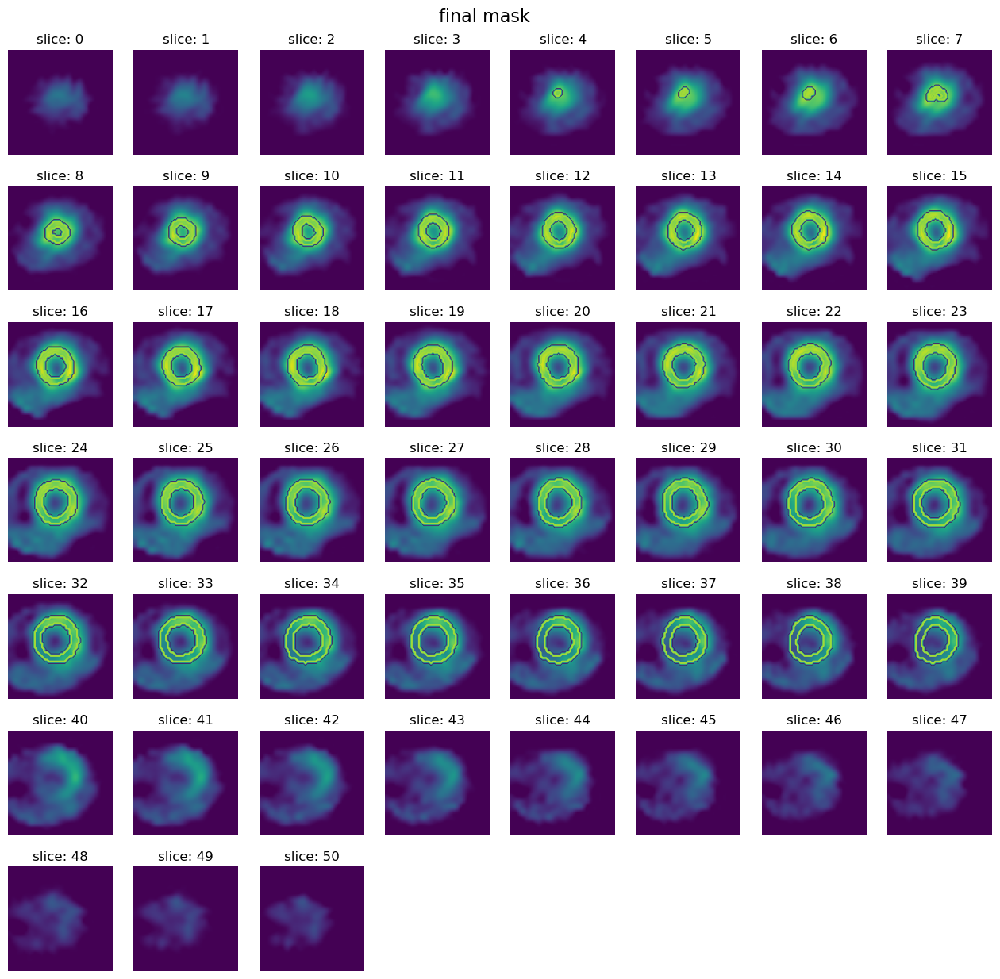

Patient_0003
(57, 60, 60) [2.21456671 2.21456639 2.21456639]
限制条件:  min_volume(mm^3):40000, min_distance(mm):100
当前连通域:  volume:98927.61385621347, distance:32.534217552303446
限制条件:  min_volume(mm^3):40000, min_distance(mm):100
当前连通域:  volume:237.8159846103383, distance:110.92959022140258
限制条件:  min_volume(mm^3):40000, min_distance(mm):100
当前连通域:  volume:30.685933498108167, distance:113.80264849736456
naive_segment_lv_mask Success
{
    "center": {
        "cy": 26.0,
        "cx": 28.109048767179434
    },
    "radius": 15.078112642325818,
    "apex_z": 0,
    "base_z": 40,
    "dividing_z": 25.617168963488727
}


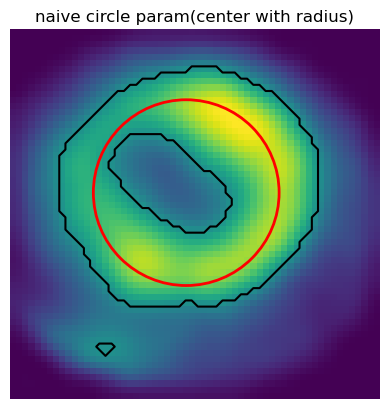

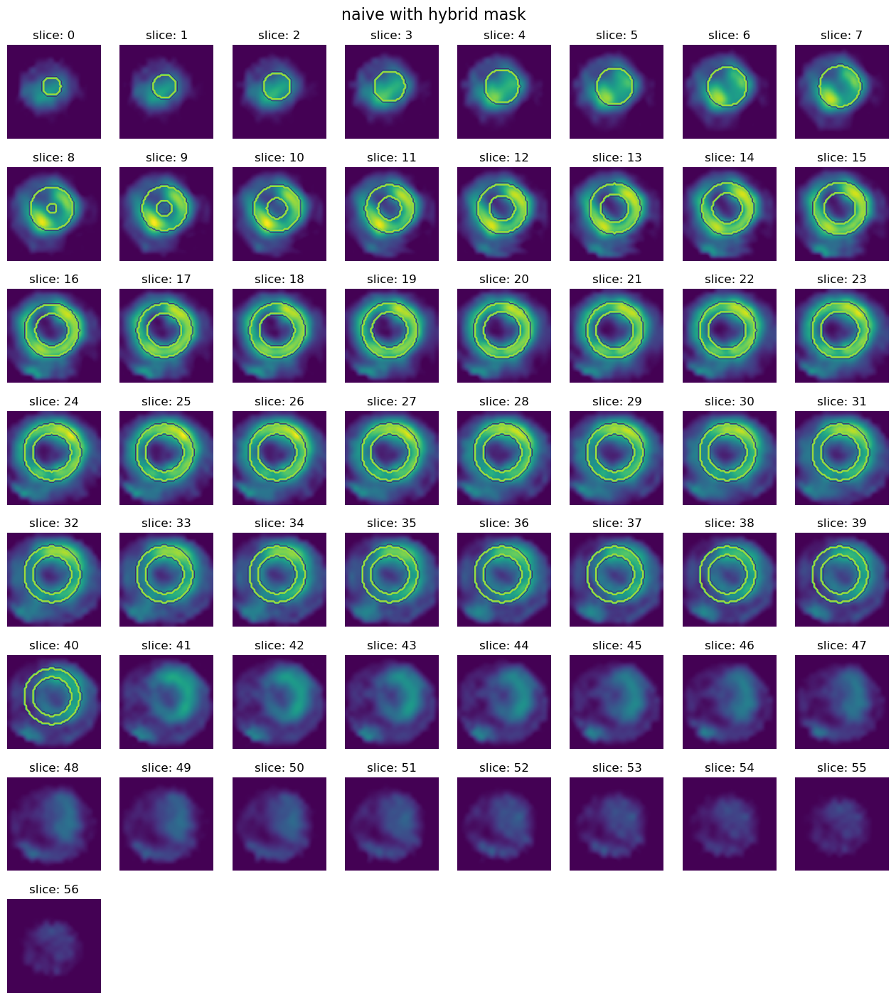

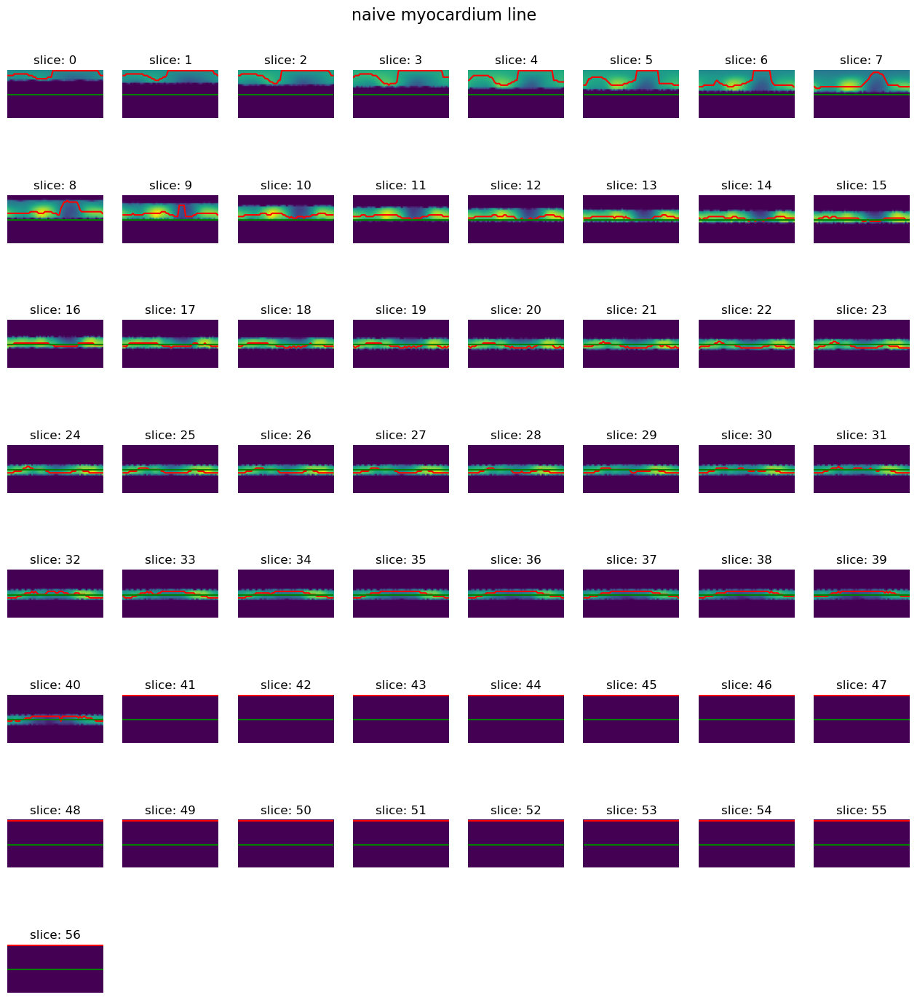

*******************************New param*******************************
True True True True
{
    "center": {
        "cy": 25.612583755605453,
        "cx": 28.132398939270978
    },
    "radius": 16.0,
    "apex_z": 1,
    "base_z": 38,
    "z_map": null,
    "dividing_z": 27.0
}


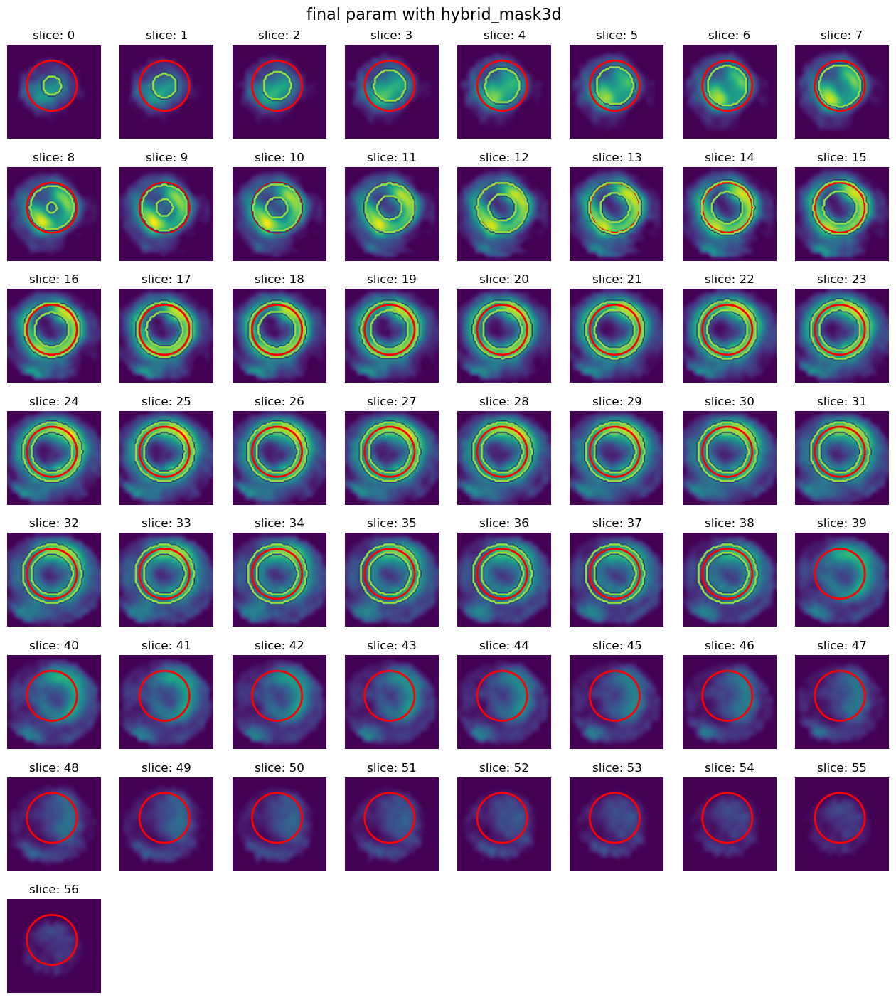

*******************************final_param_with_plane*******************************
{
    "center": {
        "cy": 25.612583755605453,
        "cx": 28.132398939270978
    },
    "radius": 16.0,
    "apex_z": 1,
    "base_z": 38,
    "z_map": null,
    "dividing_z": 27.0,
    "plane": {
        "a": 0,
        "b": 0,
        "c": 0,
        "d": 1
    },
    "angled_plane": {
        "39": [
            0,
            1,
            2,
            3,
            4,
            5,
            6,
            7,
            8,
            9,
            10,
            11,
            12,
            13,
            14,
            15,
            16,
            17,
            18,
            19,
            20,
            21,
            22,
            23,
            24,
            25,
            26,
            27,
            28,
            29,
            30,
            31,
            32,
            33,
            34,
            35,
            36,
            37,
    

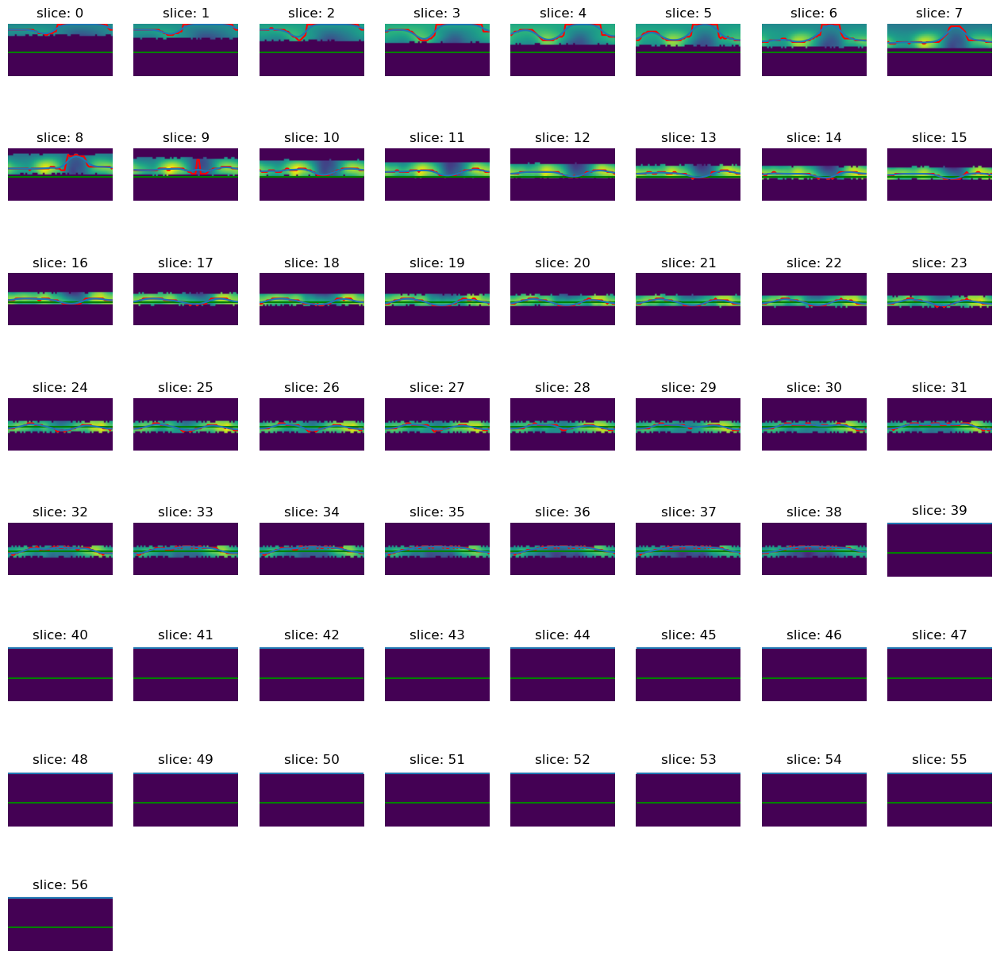

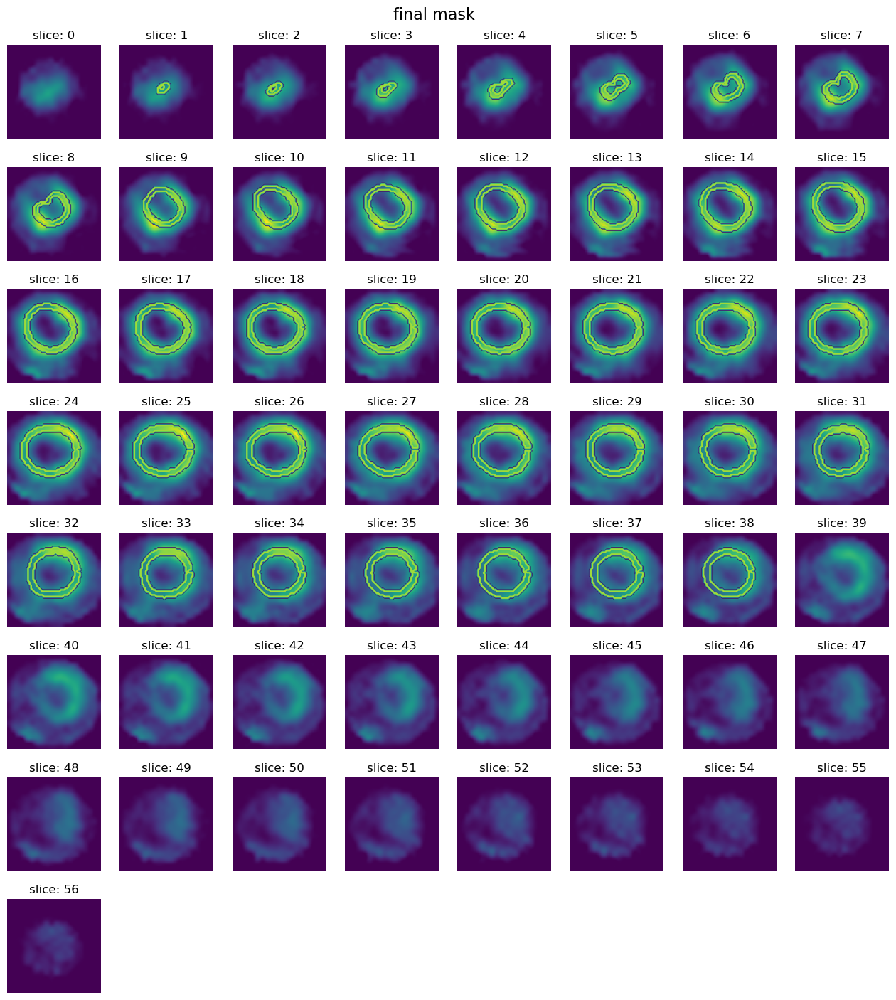

In [6]:
base_dir = r"Y:\labspace\DataCollection\Project\RadiSmart\cardiac\all_nii"
dir_names = sorted(os.listdir(base_dir))[:5]

for dir_name in dir_names:
    img_paths = glob(os.path.join(base_dir, dir_name, "*.nii.gz"))
    if len(img_paths) < 2:
        continue
    
    img_path = glob(os.path.join(base_dir, dir_name, "SA*.nii.gz"))[0]
    img3d, voxel_size = read_sitk_img(img_path, 3)
    
    
    print(f"{dir_name}")
    print(img3d.shape, voxel_size)
    naive_param = naive_locate(img3d, voxel_size, verbose=2)
    naive_myocardium_line_param = naive_cal_myocardium_line_param(img3d, naive_param, verbose=2)
    final_param = recursive_search_myocardium_line_param(img3d, naive_param, naive_myocardium_line_param, verbose=2)
    lv_mask3d = generate_mask3d_from_param(img3d, final_param, verbose=2)
    
    # break
    

    
